<a href="https://colab.research.google.com/github/lorenarms/Machine_Learning/blob/main/dog_classification/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier usering TensorFlow 20 and TensorFlow Hub.

## 1. Problem

Identifying the breed of dog given an image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* Images (unstructured data)
* 120 breeds of dogs (120 different classes)
* There are 10,000+ images in the training set
* There are 10,000+ images in the test set (images with no labels)

## Getting the Workspace Ready

- [X] Import Tensorflow
- [X] Import Tensorflow Hub
- [X] Ensure the use of a GPU


In [1]:
# optional: import tf version 2.x
# in the event version 2.x is not automatically imported

# try:
#   %tensorflow_version 2.x
# except Exception
#   pass


In [2]:
# import necessary things
import tensorflow as tf
import tensorflow_hub as hub
print('TF version: ', tf.__version__)
print('TF Hub version: ', hub.__version__)

# check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.12.0
TF Hub version:  0.14.0
GPU not available


## Getting the Data Ready

In [3]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


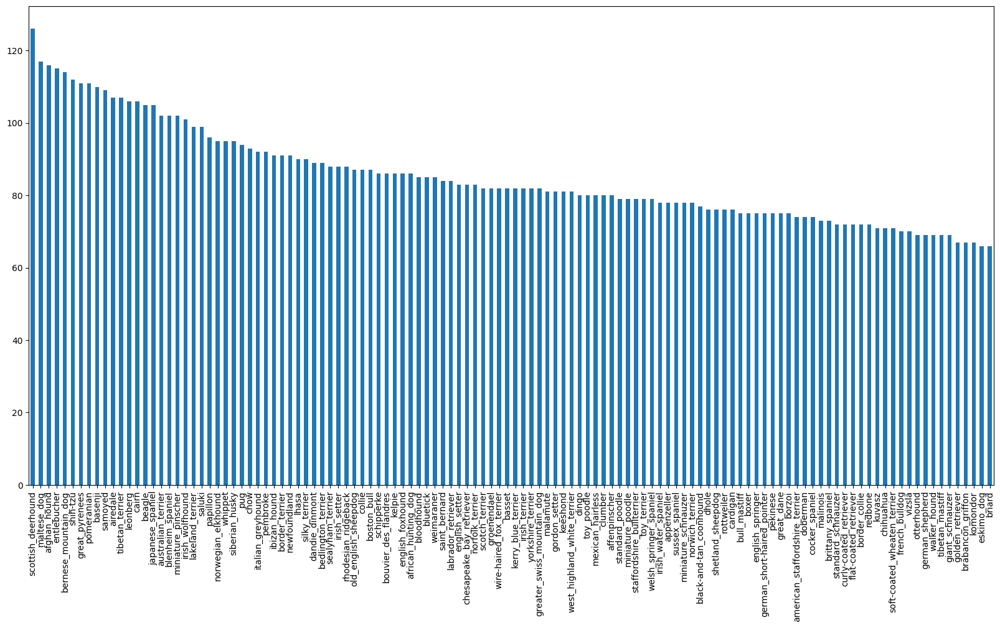

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [6]:
# Google recommends minimum 100 annotations (images) per label
# requires minimum of 10 per label
labels_csv["breed"].value_counts().median()

82.0

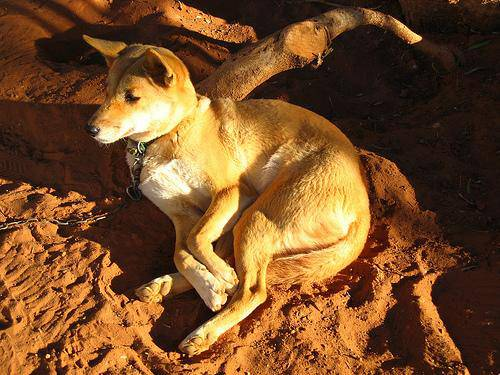

In [7]:
# viewing an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their Labels

In [8]:
# Create path names from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

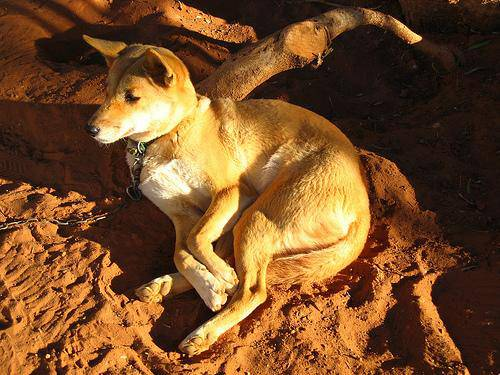

In [9]:
# now we can view the pictures easier
Image(filenames[1])

In [10]:
len(filenames), len(labels_csv)

(10222, 10222)

In [11]:
# check that file amounts match
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/train/")) == len(filenames):
  print("Amount of files match")
else:
  print("Amount of files DO NOT match")

Amount of files match


## Turning Data Labels into Numbers

In [12]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
len(labels)

10222

In [13]:
# Find number of unique values in array
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
len(unique_breeds)

120

In [15]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
labels[0]

'boston_bull'

In [17]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a '1' where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own Validation Set
The set from Kaggle doesn't come with validation so we'll create our own

In [20]:
# setup variables
from sklearn.model_selection import train_test_split

X = filenames
y = boolean_labels

NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step: 100}

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [21]:
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

## Turning Images into Tensors
Preprocessing Images


In [22]:
# preprocessing function for images
# 1. take image filepath as input
# 2. use Tensorflow to read filepath, save to variable 'image'
# 3. turn image (.jpg) into Tensors
# 4. normalize image
# 5. resize image to shape of 224, 224
# 6. return modified image



In [23]:
# sample function
from matplotlib.pyplot import imread
image = imread(filenames[42])

# turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [24]:
# define an image preproceessing function
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # read in image file
  image = tf.io.read_file(image_path)
  # turn jpg image into numerical Tensor with 3 color channels (r g b)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert color channel values from 0-255 values to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning data into Batches

Allows for processing more efficiently, given the amount of memory you have access to

We'll create Tensor tuples for our batches


In [25]:
# function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image, and returns a type of (image, label)
  """
  image = process_image(image_path)
  return image, label


In [26]:
# demo of above function
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# Create batches of `X` and `y`

In [27]:
# define batch size (32 is a good start)
BATCH_SIZE = 32

# function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it is training data, but does not shuffle if it's validation data.
  Also accepts test data as input (no labels)
  """
  # if data is test dataset, no labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # valid dataset, no shuffle
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # turn file paths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # shuffle
    data = data.shuffle(buffer_size=len(X))
    # create (image, label) tuples, preprocess
    data = data.map(get_image_label)

    # turn training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch



In [28]:
# create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [29]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [30]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Display a plot of 25 images and their labels from a data batch.
  """
  # setup the fiture
  plt.figure(figsize=(10, 10))
  # loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots
    ax = plt.subplot(5, 5, i + 1)
    # display and image
    plt.imshow(images[i])
    # add image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn grid lines off
    plt.axis("off")

In [31]:
# take the batch, unwind as numpy iterator
# 'next' will grab the first batch
# train_images will be the first var pulled from the batch, train_labels will be the second
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels) # batch size is 32

(32, 32)

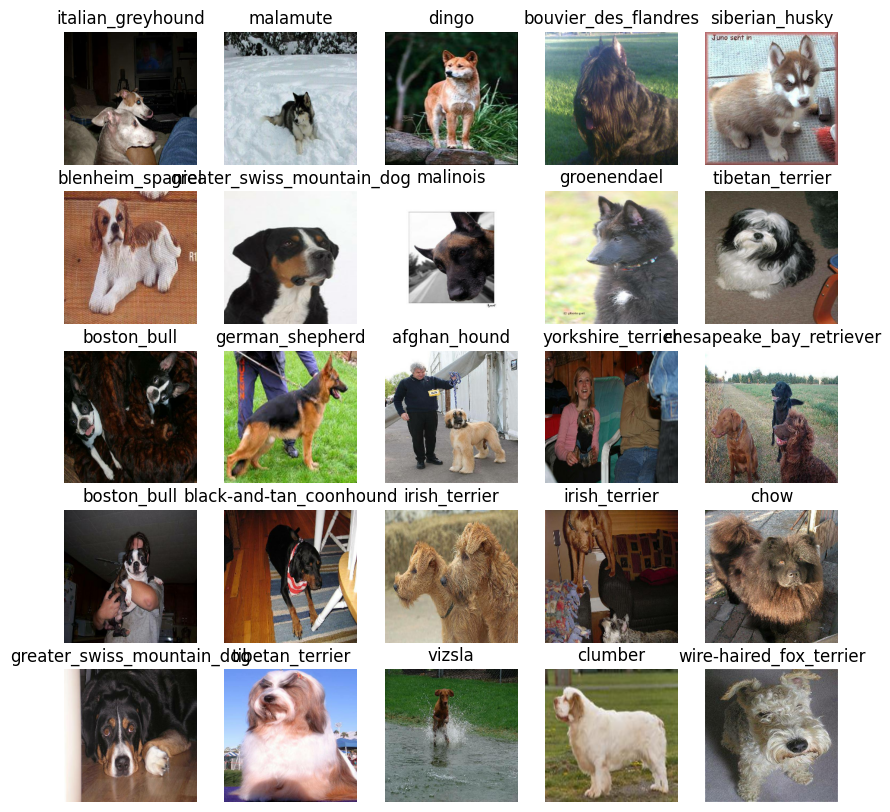

In [32]:
# visualizing the data
show_25_images(train_images, train_labels)

# Building the Model

Define the following:
1. Input shape to our model
2. Output shape of our model
3. URL of the model we want to use

In [33]:
# input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels
# output shape
OUTPUT_SHAPE = len(unique_breeds)
# model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

More models here:
https://www.tensorflow.org/hub


### Creating a Keras deep learning model: a function
* Takes input shape, output shape, and model we've choosen
* Define the layers in the Keras model
* Build the model
* Return the model


In [34]:
# function
def create_model(input_shape = INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # setup layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # layer 2 (output)

  ])

  # compile model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # loss is how well model is learning, lower=better
      optimizer=tf.keras.optimizers.Adam(), # helps model navigate the data
      metrics=["accuracy"] # judge of performance
  )

  # build model
  model.build(INPUT_SHAPE)

  return model

In [35]:
model=create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


The above model is previously trained, meaning we are using "transfer learning". The summary shows that over 5 million parameters that were previously learned (patterns found during initial trainings) are not needed for our model here. However, 120,000 parameters *will* be useful in our model, so the model will focus on those learned patterns.

## Creating Callbacks
Callbacks are helper functions that a model can use during training to do things like
* save progress
* check progress
* stop training early

### Two callbacks:
1. TensorBoard
  * tracks model progress
2. Overfitting callback
  * allows for early stopping

In [36]:
# TensorBoard notebook extension
%load_ext tensorboard

In [37]:
# track model progress

import datetime
def create_tensorboard_callback():
  # create log directory for storing logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/logs/",
                        # track logs when we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [38]:
# preventing overfitting - early stop the fitting when certain metrics stop improving

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)



# Train the Model

Training only with 1000 images to start, so we can evaluate and check that the model is working correctly

We'll also set the number of epochs (passes) that we want the model to do while training

In [39]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step: 100}

In [40]:
# build function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version

  """
  model = create_model()

  tensorboard = create_tensorboard_callback()

  # fit model to data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [41]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 361s 15s/step - loss: 4.7627 - accuracy: 0.0825 - val_loss: 3.5971 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 101s 4s/step - loss: 1.7254 - accuracy: 0.6600 - val_loss: 2.2318 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 71s 3s/step - loss: 0.5852 - accuracy: 0.9337 - val_loss: 1.7504 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 68s 3s/step - loss: 0.2558 - accuracy: 0.9900 - val_loss: 1.5586 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 69s 3s/step - loss: 0.1487 - accuracy: 0.9975 - val_loss: 1.4835 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 68s 3s/step - loss: 0.1020 - accuracy: 0.9987 - val_loss: 1.4374 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================] - 75s 

The model above is overfitting (performing better on training set than on validation set). However, initial overfitting is desired as this indicates the model is learning.

In [42]:
# checking the logs
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Data/Dog\ Vision\ Data/logs

# /content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/logs/20230906-182041

<IPython.core.display.Javascript object>

## Making and Evaluating Predictions

Using validation data (not used to train)

In [43]:
# making predictions
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 15s 2s/step


array([[2.1964216e-04, 1.4831050e-05, 8.7439927e-04, ..., 1.1640076e-04,
        6.9257083e-05, 1.7647935e-03],
       [1.2295074e-03, 6.3367735e-04, 3.7057035e-02, ..., 4.1343519e-04,
        3.2444852e-03, 2.0177614e-04],
       [3.1656589e-05, 3.5166289e-05, 1.6768643e-06, ..., 2.8477416e-05,
        1.3210860e-05, 3.2982032e-04],
       ...,
       [2.4512231e-06, 1.3690052e-05, 3.4602137e-05, ..., 5.5984033e-06,
        1.0930218e-04, 3.7264535e-06],
       [6.4119999e-04, 7.9600402e-05, 9.8609133e-05, ..., 1.9555599e-04,
        1.3381877e-04, 5.3500468e-03],
       [3.1396750e-04, 2.2612343e-05, 2.9640044e-03, ..., 1.2745497e-02,
        3.5203828e-03, 1.3588040e-04]], dtype=float32)

In [44]:
predictions.shape

(200, 120)

In [45]:
len(y_val)

200

In [46]:
np.sum(predictions[0])

1.0

In [47]:
# First Predictions
index = 42
# print the predictions at the index above
print(predictions[index])
# what is the maximum value of all predictions
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
# print the sum of all predictions (should be around '1')
print(f"Sum: {np.sum(predictions[index])}")
# what is the index of the maximum value
print(f"Max index: {np.argmax(predictions[index])}")
# what breed does this index correspond with
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

# note: each value in the list of predictions is the probability that the
# prediction fits with that specific breed (out of 120)
# the highest value indicates the closest resemblance to that breed


[9.40955942e-05 1.83851123e-04 1.45182392e-04 2.86935392e-05
 3.77887790e-03 5.85571506e-05 2.89334566e-04 1.25801179e-03
 1.05525786e-02 3.19408290e-02 1.29028003e-05 2.38195253e-06
 5.72412566e-04 8.09370261e-03 5.31444966e-04 2.01106025e-03
 7.79870170e-05 5.69009455e-04 2.56040716e-04 4.49353451e-04
 1.20282575e-05 8.90714873e-04 2.45824031e-05 2.33625251e-05
 1.74501240e-02 1.93767319e-05 1.70102703e-05 1.84837554e-04
 2.59153225e-04 1.92760253e-05 6.60285441e-05 9.64259016e-05
 5.76485400e-05 7.13729023e-05 2.78504940e-05 1.05605919e-04
 4.72539505e-05 7.73226493e-05 7.61999181e-05 2.26284876e-01
 8.16485117e-05 2.39611618e-05 4.17016447e-03 1.58060732e-06
 2.15095482e-04 4.35919310e-06 8.39908389e-05 2.46654061e-04
 6.65467887e-05 4.98844427e-04 7.44244608e-05 6.71281086e-05
 1.12413167e-04 2.68514873e-03 5.86537317e-05 2.22447154e-04
 3.70416237e-05 8.14829837e-05 1.54424313e-04 1.42532037e-04
 1.68048955e-05 1.70928863e-04 2.19462140e-06 4.11120636e-05
 9.99398180e-05 9.571667

In [48]:
predictions[42][113]


0.674073

In [49]:
# turn the above functionality to something we can use at scale
# additionally, see the image the prediction is being made on

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label

'brittany_spaniel'

In [51]:
# function to unbatch dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """

  images_=[]
  labels_=[]

  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [55]:
get_pred_label(predictions[0])

'border_terrier'

## Visualizing our Predictions
We'lĺ build a function that
1. takes an array of prediction probabilities, an array of truth labels, and an array of images
2. Convert the prediction probabilites to a predicted label
3. Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot

In [61]:
# function to plot prediction and image
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth, and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)
  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change for color of the title depending on if prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # cahnge plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

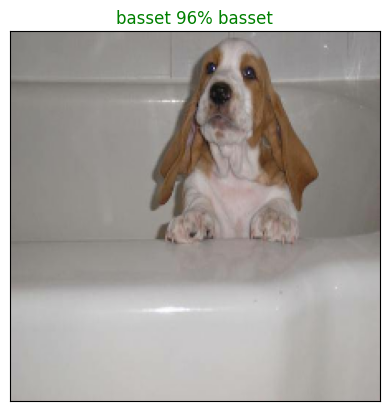

In [70]:
plot_pred(prediction_probabilities = predictions,
labels=val_labels,
images=val_images,
          n=2)

Now let's build a function to view our models top 10 predictions
1. take an input of prediction probabilities array, ground truth array, and an integer
2. find the prediction using `get_pred_label()`
3. find the top ten
  * prediction probabilities indexes
  * prediction probabilities values
  * prediction labels
4. Plot the top 10 values and labels, coloring the true label green

In [79]:
def plot_pred_conf(prediction_probabilites, labels, n=1):

  pred_prob, true_label = prediction_probabilites[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  # find top ten prediction confidence indexes
  top_ten_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # find top 10 prediction confidence values
  top_ten_pred_values = pred_prob[top_ten_pred_indexes]

  # find the top ten prediction labels
  top_ten_pred_labels = unique_breeds[top_ten_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_ten_pred_labels)),
                     top_ten_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_ten_pred_labels)),
             labels=top_ten_pred_labels,
             rotation="vertical")

  # change colr or true label
  if np.isin(true_label, top_ten_pred_labels):
    top_plot[np.argmax(top_ten_pred_labels == true_label)].set_color("green")
  else:
    pass

In [75]:
predictions[0][predictions[0].argsort()[-10:][::-1]] # top ten in descending order

array([0.59322226, 0.16660424, 0.04017458, 0.03211383, 0.01938339,
       0.01832306, 0.01412535, 0.01388868, 0.01180834, 0.01147424],
      dtype=float32)

In [77]:
predictions[0].max()

0.59322226

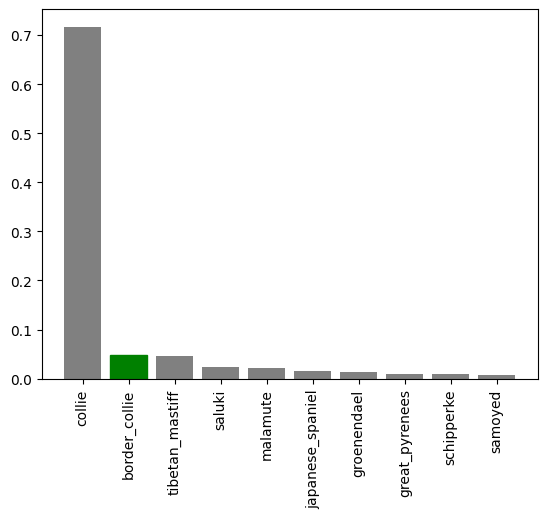

In [83]:
plot_pred_conf(prediction_probabilites=predictions,
               labels=val_labels,
               n=9)

## Viewing multiple images
Using subplots

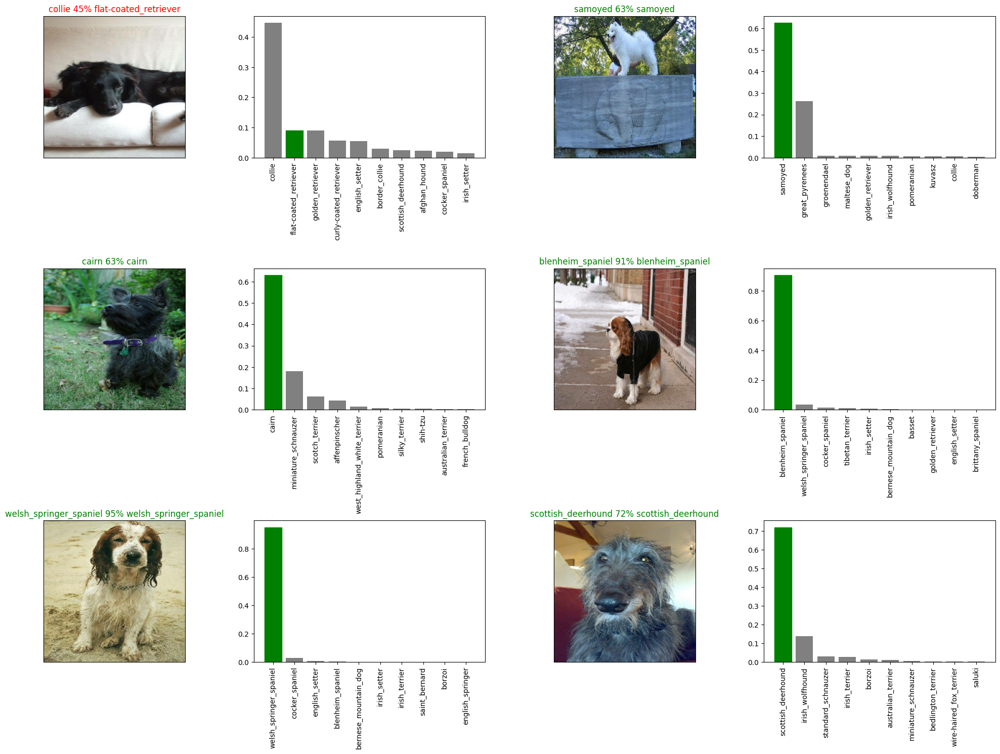

In [94]:
# let's look at a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilites=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and Reloading a Model


In [96]:
# create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)

  """
  # create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [97]:
# create function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:  {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [98]:
# testing save
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/models/20230907-024830-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/models/20230907-024830-1000-images-mobilenetv2-Adam.h5'

In [99]:
# loading the model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/models/20230907-024830-1000-images-mobilenetv2-Adam.h5")

Loading saved model from:  /content/drive/MyDrive/Colab Notebooks/Data/Dog Vision Data/models/20230907-024830-1000-images-mobilenetv2-Adam.h5


In [102]:
# evaluate pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 18s 3s/step - loss: 1.2917 - accuracy: 0.6650


[1.291653037071228, 0.6650000214576721]

In [103]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 16s 2s/step - loss: 1.2917 - accuracy: 0.6650


[1.291653037071228, 0.6650000214576721]